In [17]:
!pip install scikit-learn opencv-python numpy matplotlib tqdm


[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: C:\Users\DELL\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Import Libraries and Load Data

In [18]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfTransformer
import time
from tqdm import tqdm
import os
import random
from glob import glob


 Define Feature Extraction Functions

In [19]:
def extract_sift_features(images):
    """Extract SIFT features from a list of images"""
    sift = cv.SIFT_create()
    all_descriptors = []
    all_features = []
    
    print("Extracting SIFT features...")
    for img in tqdm(images):
        if img is None:
            all_features.append(None)
            continue
            
        gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
        keypoints, descriptors = sift.detectAndCompute(gray, None)
        
        if descriptors is not None and len(keypoints) > 0:
            all_descriptors.append(descriptors)
            all_features.append(descriptors)
        else:
            all_features.append(None)
    
    # Stack all descriptors
    if all_descriptors:
        all_descriptors = np.vstack(all_descriptors)
    else:
        all_descriptors = np.array([])
    
    return all_features, all_descriptors

Create Visual Vocabulary

In [20]:
def build_vocabulary(descriptors, k):
    """Build visual vocabulary by clustering the descriptors"""
    print(f"Building vocabulary with {k} visual words...")
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(descriptors)
    return kmeans

Create Feature Representations

In [21]:
def create_bow_histograms(features, kmeans):
    """Create Bag of Words histograms for each image"""
    vocab_size = kmeans.cluster_centers_.shape[0]
    histograms = []
    
    print("Creating BoW histograms...")
    for descriptors in tqdm(features):
        hist = np.zeros(vocab_size)
        
        if descriptors is not None:
            # Assign each descriptor to a cluster
            predictions = kmeans.predict(descriptors)
            
            # Create histogram of visual words
            for pred in predictions:
                hist[pred] += 1
                
            # Normalize histogram
            if np.sum(hist) > 0:
                hist = hist / np.sum(hist)
        
        histograms.append(hist)
    
    return np.array(histograms)

def create_tfidf_representation(bow_histograms):
    """Convert BoW histograms to TF-IDF representation"""
    print("Creating TF-IDF representation...")
    transformer = TfidfTransformer()
    tfidf = transformer.fit_transform(bow_histograms).toarray()
    return tfidf

Image Retrieval Functions

In [22]:
def retrieve_images(query_idx, feature_matrix, n=5):
    """Retrieve the top N most similar images"""
    query_vector = feature_matrix[query_idx:query_idx+1]
    similarities = cosine_similarity(query_vector, feature_matrix).flatten()
    
    # Exclude the query image itself
    similarities[query_idx] = 0
    
    # Get indices of top N similar images
    top_indices = np.argsort(similarities)[::-1][:n]
    top_similarities = similarities[top_indices]
    
    return top_indices, top_similarities

def display_retrieval_results(query_idx, retrieved_indices, similarities, images, title="Image Retrieval Results"):
    """Display query image and retrieved images with their similarity scores"""
    n = len(retrieved_indices)
    plt.figure(figsize=(15, 4))
    
    # Display query image
    plt.subplot(1, n+1, 1)
    plt.imshow(cv.cvtColor(images[query_idx], cv.COLOR_BGR2RGB))
    plt.title("Query Image")
    plt.axis('off')
    
    # Display retrieved images
    for i, (idx, sim) in enumerate(zip(retrieved_indices, similarities)):
        plt.subplot(1, n+1, i+2)
        plt.imshow(cv.cvtColor(images[idx], cv.COLOR_BGR2RGB))
        plt.title(f"Sim: {sim:.4f}")
        plt.axis('off')
    
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

Experiment Functions

In [23]:
def experiment_image_count(images, query_indices, image_counts=[100, 500, 1000], k=200, n=5):
    """Experiment 1: Vary the number of images used to compute centroids"""
    results = {}
    
    for count in image_counts:
        print(f"\n=== Experiment with {count} training images ===")
        
        # Select random subset for training
        training_indices = np.random.choice(len(images), count, replace=False)
        training_images = [images[i] for i in training_indices]
        
        # Extract features from training images
        _, all_descriptors = extract_sift_features(training_images)
        
        # Build vocabulary from training features
        kmeans = build_vocabulary(all_descriptors, k)
        
        # Extract features from all images
        all_features, _ = extract_sift_features(images)
        
        # Create BoW histograms
        bow_histograms = create_bow_histograms(all_features, kmeans)
        
        # For each query image
        query_results = {}
        for query_idx in query_indices:
            # Retrieve similar images
            retrieved_indices, similarities = retrieve_images(query_idx, bow_histograms, n)
            
            # Display results
            display_retrieval_results(
                query_idx, retrieved_indices, similarities, 
                images, f"Query Results - {count} Training Images"
            )
            
            query_results[query_idx] = {
                'retrieved_indices': retrieved_indices,
                'similarities': similarities
            }
        
        results[count] = query_results
    
    return results

def experiment_centroid_count(images, query_indices, image_count=1000, centroid_counts=[100, 200, 500], n=5):
    """Experiment 2: Vary the number of centroids"""
    results = {}
    
    # Select random subset for training
    training_indices = np.random.choice(len(images), image_count, replace=False)
    training_images = [images[i] for i in training_indices]
    
    # Extract features from training images
    _, all_descriptors = extract_sift_features(training_images)
    
    # Extract features from all images
    all_features, _ = extract_sift_features(images)
    
    for k in centroid_counts:
        print(f"\n=== Experiment with {k} centroids ===")
        
        # Build vocabulary from training features
        kmeans = build_vocabulary(all_descriptors, k)
        
        # Create BoW histograms
        bow_histograms = create_bow_histograms(all_features, kmeans)
        
        # For each query image
        query_results = {}
        for query_idx in query_indices:
            # Retrieve similar images
            retrieved_indices, similarities = retrieve_images(query_idx, bow_histograms, n)
            
            # Display results
            display_retrieval_results(
                query_idx, retrieved_indices, similarities, 
                images, f"Query Results - {k} Centroids"
            )
            
            query_results[query_idx] = {
                'retrieved_indices': retrieved_indices,
                'similarities': similarities
            }
        
        results[k] = query_results
    
    return results

def experiment_tfidf_vs_bow(images, query_indices, image_count=1000, k=200, n=5):
    """Experiment 3: Compare TF-IDF and BoW for feature representation"""
    results = {'bow': {}, 'tfidf': {}}
    
    # Select random subset for training
    training_indices = np.random.choice(len(images), image_count, replace=False)
    training_images = [images[i] for i in training_indices]
    
    # Extract features from training images
    _, all_descriptors = extract_sift_features(training_images)
    
    # Build vocabulary from training features
    kmeans = build_vocabulary(all_descriptors, k)
    
    # Extract features from all images
    all_features, _ = extract_sift_features(images)
    
    # Create BoW histograms
    bow_histograms = create_bow_histograms(all_features, kmeans)
    
    # Create TF-IDF representation
    tfidf_representation = create_tfidf_representation(bow_histograms)
    
    # For each query image
    for query_idx in query_indices:
        # BoW results
        bow_indices, bow_similarities = retrieve_images(query_idx, bow_histograms, n)
        
        # TF-IDF results
        tfidf_indices, tfidf_similarities = retrieve_images(query_idx, tfidf_representation, n)
        
        # Display results
        display_retrieval_results(
            query_idx, bow_indices, bow_similarities, 
            images, f"Query Results - Bag of Words"
        )
        
        display_retrieval_results(
            query_idx, tfidf_indices, tfidf_similarities, 
            images, f"Query Results - TF-IDF"
        )
        
        results['bow'][query_idx] = {
            'retrieved_indices': bow_indices,
            'similarities': bow_similarities
        }
        results['tfidf'][query_idx] = {
            'retrieved_indices': tfidf_indices,
            'similarities': tfidf_similarities
        }
    
    return results

Running the Experiments

In [24]:
data =glob(r"E:\ZC-UST\3rd Year\Semester #2\Computer Vision DSAI 352\Assignments\SIFT\images\*\*.jpg")
len(data),type(data)

(3600, list)

In [25]:
data1=[]
for i in range(3600):
    data1.append(cv.imread(data[i],1))


=== Experiment with 50 training images ===
Extracting SIFT features...


100%|██████████| 50/50 [00:02<00:00, 18.72it/s]


Building vocabulary with 200 visual words...
Extracting SIFT features...


100%|██████████| 200/200 [00:15<00:00, 12.69it/s]


Creating BoW histograms...


100%|██████████| 200/200 [00:01<00:00, 160.87it/s]


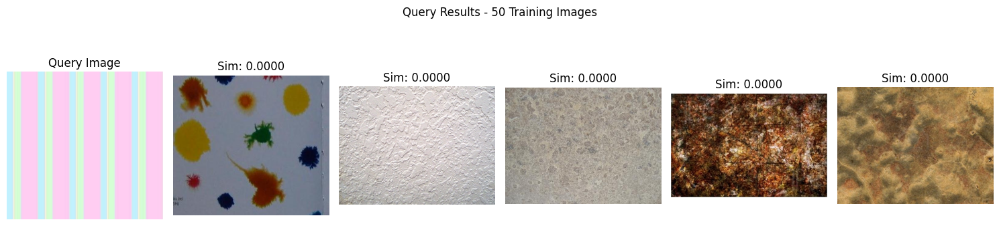

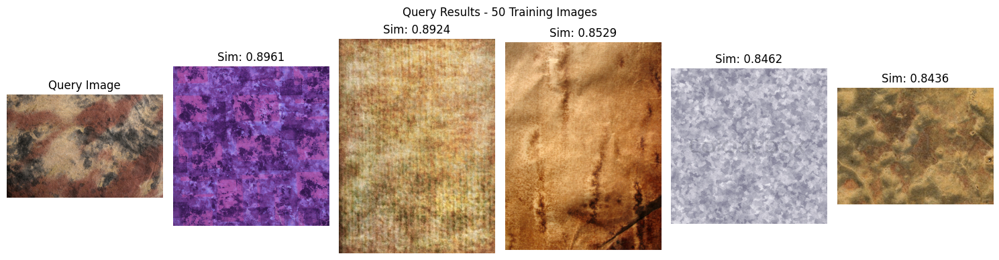

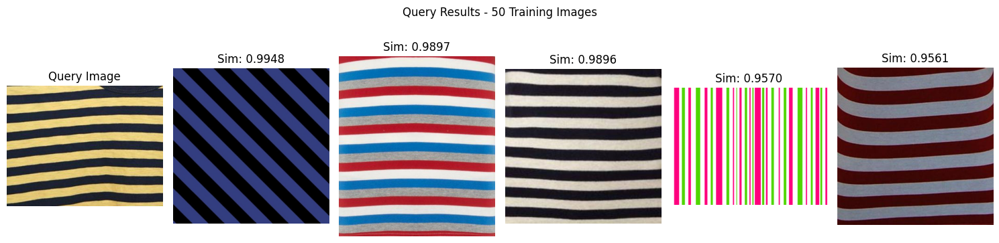


=== Experiment with 100 training images ===
Extracting SIFT features...


100%|██████████| 100/100 [00:08<00:00, 12.09it/s]


Building vocabulary with 200 visual words...
Extracting SIFT features...


100%|██████████| 200/200 [00:10<00:00, 18.91it/s]


Creating BoW histograms...


100%|██████████| 200/200 [00:00<00:00, 257.01it/s]


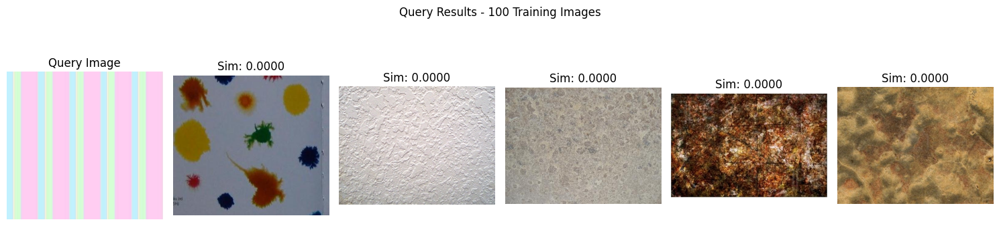

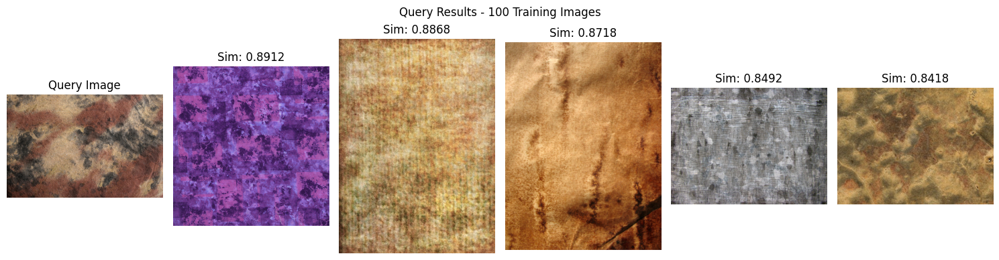

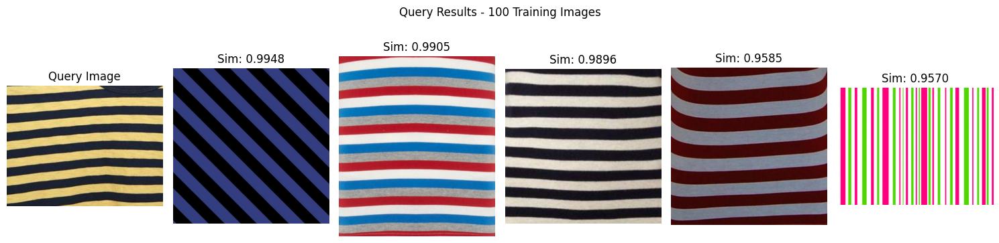


=== Experiment with 200 training images ===
Extracting SIFT features...


100%|██████████| 200/200 [00:10<00:00, 18.63it/s]


Building vocabulary with 200 visual words...
Extracting SIFT features...


100%|██████████| 200/200 [00:11<00:00, 17.79it/s]


Creating BoW histograms...


100%|██████████| 200/200 [00:00<00:00, 272.48it/s]


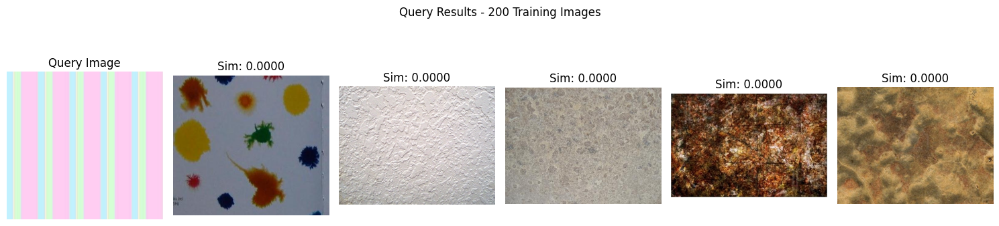

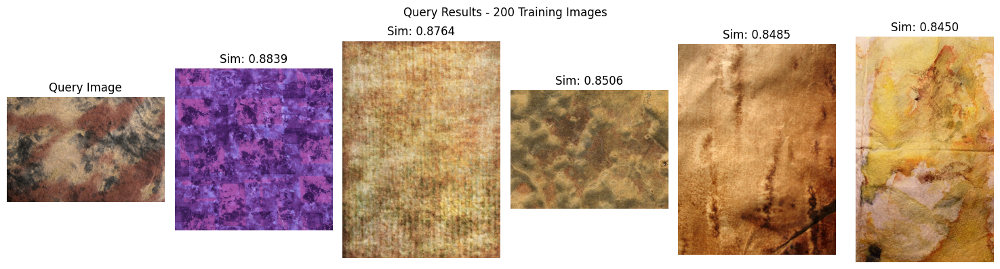

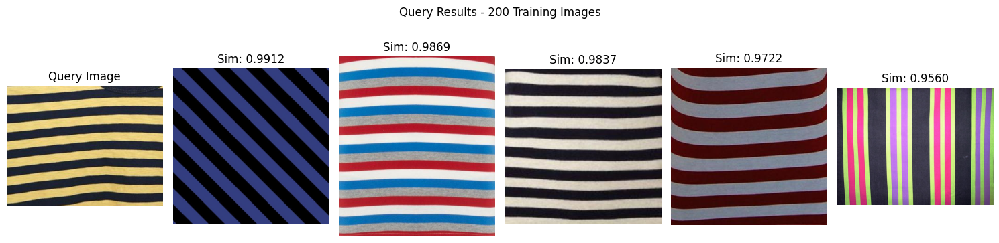

In [26]:
# Use a subset of images for efficiency
sample_size = 200  
data_subset = data1[:sample_size]

# Select random query indices
num_queries = 3
query_indices = random.sample(range(len(data_subset)), num_queries)

# Experiment 1: Vary the number of images used to compute centroids
image_counts = [50, 100, 200]  
exp1_results = experiment_image_count(data_subset, query_indices, image_counts=image_counts, k=200)



Extracting SIFT features...


100%|██████████| 200/200 [00:10<00:00, 18.60it/s]


Extracting SIFT features...


100%|██████████| 200/200 [00:10<00:00, 19.00it/s]



=== Experiment with 50 centroids ===
Building vocabulary with 50 visual words...
Creating BoW histograms...


100%|██████████| 200/200 [00:00<00:00, 297.62it/s]


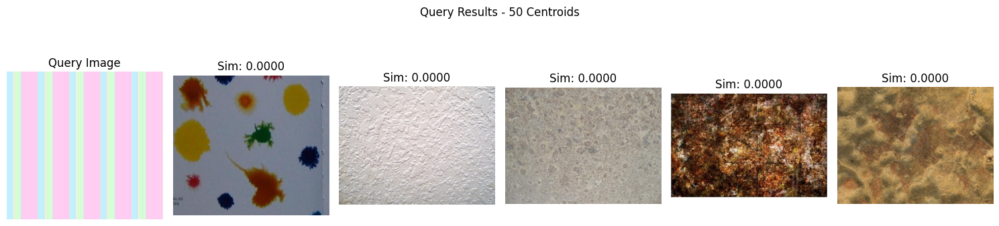

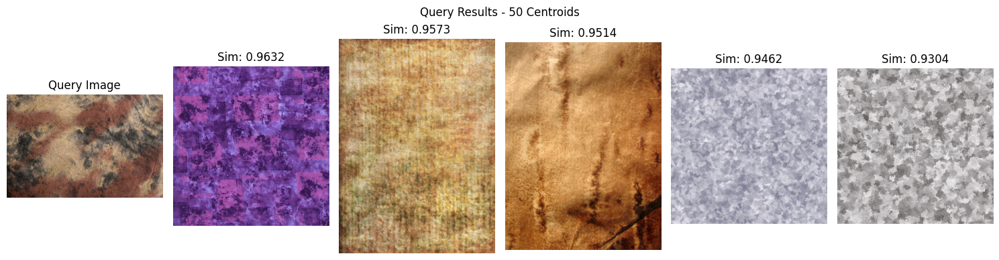

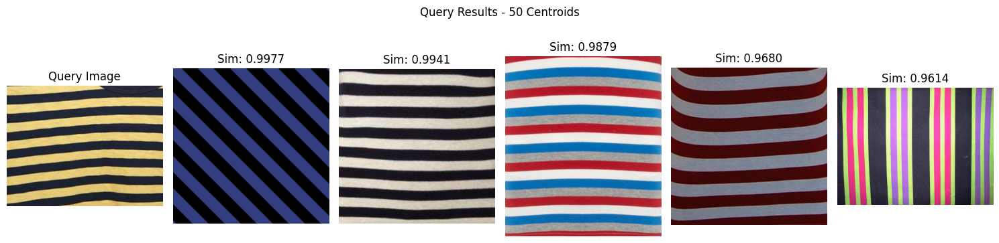


=== Experiment with 100 centroids ===
Building vocabulary with 100 visual words...
Creating BoW histograms...


100%|██████████| 200/200 [00:00<00:00, 288.50it/s]


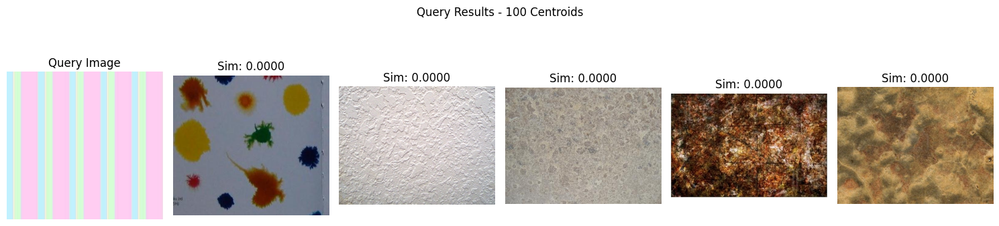

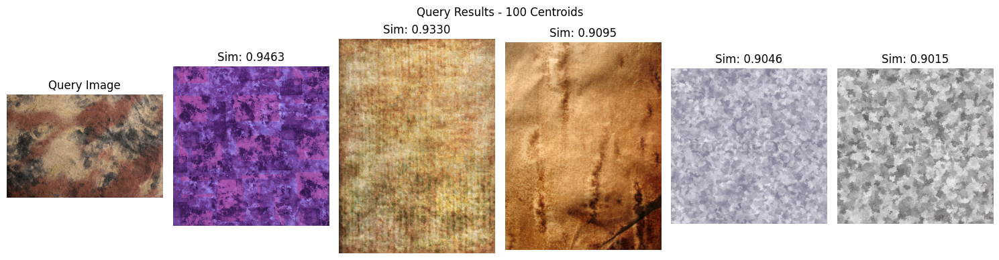

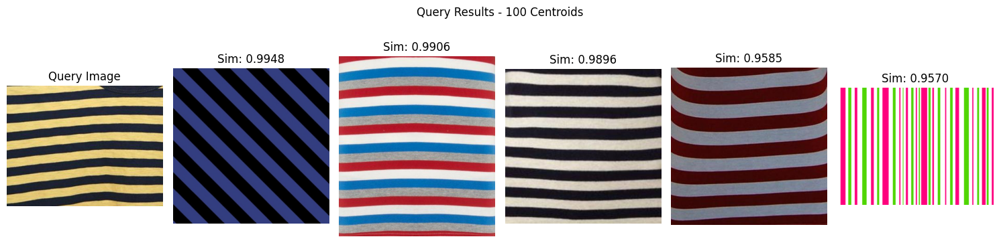


=== Experiment with 200 centroids ===
Building vocabulary with 200 visual words...
Creating BoW histograms...


100%|██████████| 200/200 [00:00<00:00, 272.48it/s]


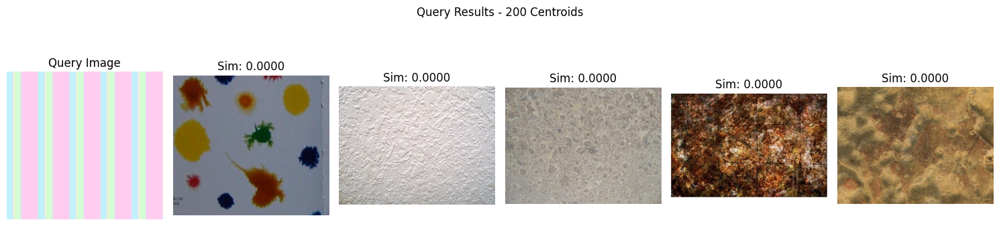

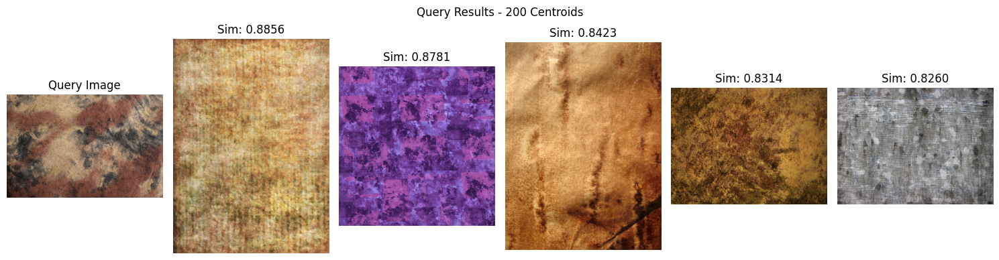

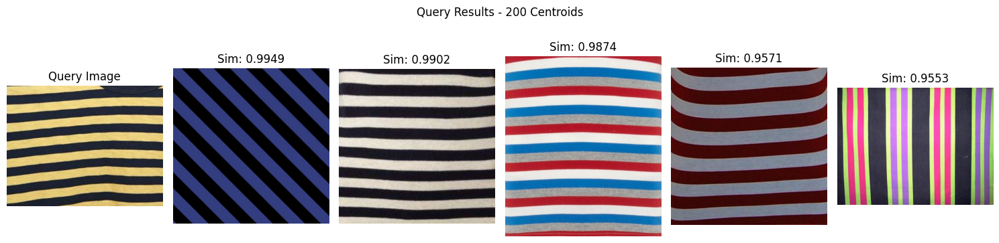

Extracting SIFT features...


100%|██████████| 200/200 [00:11<00:00, 16.92it/s]


Building vocabulary with 200 visual words...
Extracting SIFT features...


100%|██████████| 200/200 [00:10<00:00, 18.44it/s]


Creating BoW histograms...


100%|██████████| 200/200 [00:00<00:00, 232.77it/s]


Creating TF-IDF representation...


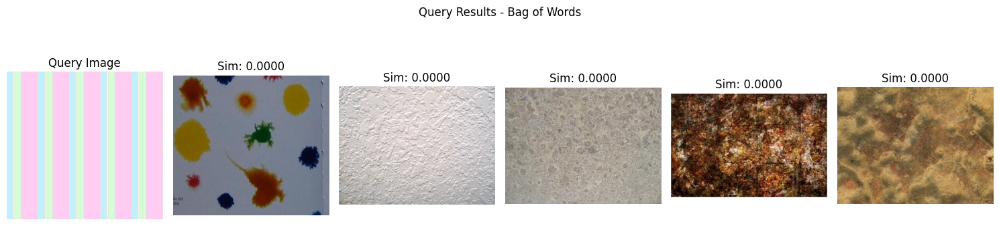

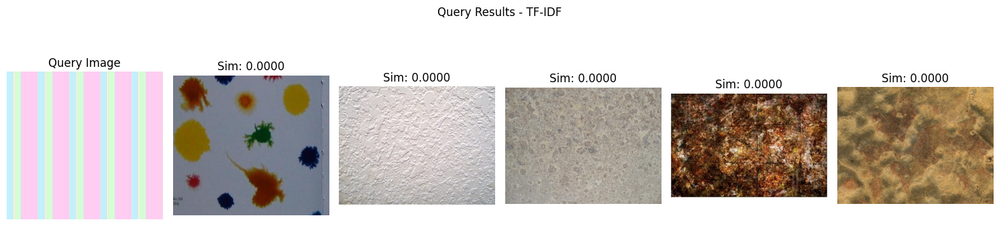

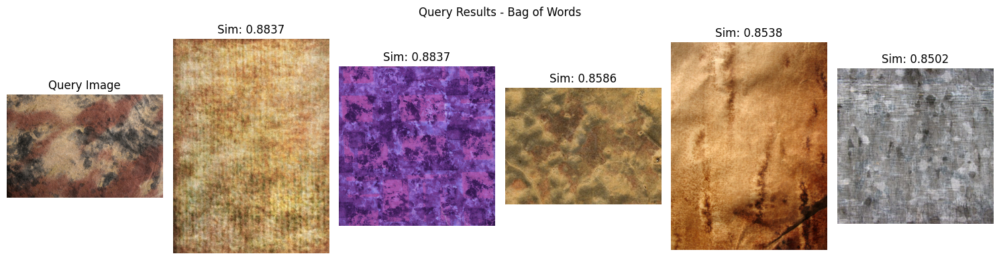

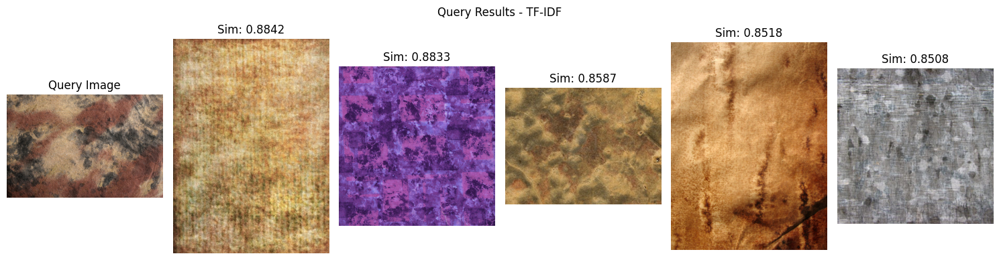

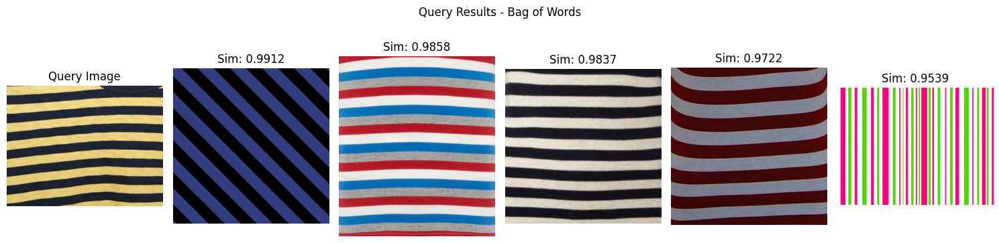

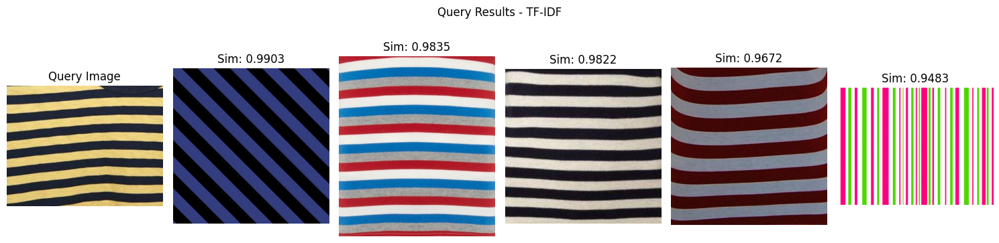

In [27]:
# Experiment 2: Vary the number of centroids
centroid_counts = [50, 100, 200]
exp2_results = experiment_centroid_count(data_subset, query_indices, image_count=200, centroid_counts=centroid_counts)

# Experiment 3: Compare TF-IDF and BoW
exp3_results = experiment_tfidf_vs_bow(data_subset, query_indices, image_count=200, k=200)

Analysis and Evaluation

In [28]:
def analyze_results(exp1_results, exp2_results, exp3_results, query_indices):
    """Analyze and compare the results from all experiments"""
    # Analyze Experiment 1: Varying number of images
    print("\n=== Analysis of Experiment 1: Varying number of training images ===")
    for count, results in exp1_results.items():
        avg_similarities = []
        for query_idx in query_indices:
            avg_similarities.append(np.mean(results[query_idx]['similarities']))
        
        overall_avg = np.mean(avg_similarities)
        print(f"Training images: {count}, Average similarity: {overall_avg:.4f}")
    
    # Analyze Experiment 2: Varying number of centroids
    print("\n=== Analysis of Experiment 2: Varying number of centroids ===")
    for k, results in exp2_results.items():
        avg_similarities = []
        for query_idx in query_indices:
            avg_similarities.append(np.mean(results[query_idx]['similarities']))
        
        overall_avg = np.mean(avg_similarities)
        print(f"Centroids: {k}, Average similarity: {overall_avg:.4f}")
    
    # Analyze Experiment 3: TF-IDF vs BoW
    print("\n=== Analysis of Experiment 3: TF-IDF vs BoW ===")
    bow_avgs = []
    tfidf_avgs = []
    
    for query_idx in query_indices:
        bow_avgs.append(np.mean(exp3_results['bow'][query_idx]['similarities']))
        tfidf_avgs.append(np.mean(exp3_results['tfidf'][query_idx]['similarities']))
    
    bow_overall_avg = np.mean(bow_avgs)
    tfidf_overall_avg = np.mean(tfidf_avgs)
    
    print(f"BoW average similarity: {bow_overall_avg:.4f}")
    print(f"TF-IDF average similarity: {tfidf_overall_avg:.4f}")
    print(f"Difference (TF-IDF - BoW): {tfidf_overall_avg - bow_overall_avg:.4f}")

# Run the analysis
analyze_results(exp1_results, exp2_results, exp3_results, query_indices)


=== Analysis of Experiment 1: Varying number of training images ===
Training images: 50, Average similarity: 0.6146
Training images: 100, Average similarity: 0.6154
Training images: 200, Average similarity: 0.6130

=== Analysis of Experiment 2: Varying number of centroids ===
Centroids: 50, Average similarity: 0.6438
Centroids: 100, Average similarity: 0.6324
Centroids: 200, Average similarity: 0.6099

=== Analysis of Experiment 3: TF-IDF vs BoW ===
BoW average similarity: 0.6145
TF-IDF average similarity: 0.6134
Difference (TF-IDF - BoW): -0.0011


Determine Optimal Parameters

In [29]:
def identify_optimal_parameters(exp1_results, exp2_results, exp3_results, query_indices):
    """Identify the best-performing parameters from all experiments"""
    # Find optimal image count
    image_count_scores = {}
    for count, results in exp1_results.items():
        avg_similarities = []
        for query_idx in query_indices:
            avg_similarities.append(np.mean(results[query_idx]['similarities']))
        image_count_scores[count] = np.mean(avg_similarities)
    
    optimal_image_count = max(image_count_scores, key=image_count_scores.get)
    
    # Find optimal centroid count
    centroid_scores = {}
    for k, results in exp2_results.items():
        avg_similarities = []
        for query_idx in query_indices:
            avg_similarities.append(np.mean(results[query_idx]['similarities']))
        centroid_scores[k] = np.mean(avg_similarities)
    
    optimal_centroids = max(centroid_scores, key=centroid_scores.get)
    
    # Determine if TF-IDF or BoW is better
    bow_avgs = []
    tfidf_avgs = []
    
    for query_idx in query_indices:
        bow_avgs.append(np.mean(exp3_results['bow'][query_idx]['similarities']))
        tfidf_avgs.append(np.mean(exp3_results['tfidf'][query_idx]['similarities']))
    
    bow_overall_avg = np.mean(bow_avgs)
    tfidf_overall_avg = np.mean(tfidf_avgs)
    
    optimal_representation = "TF-IDF" if tfidf_overall_avg > bow_overall_avg else "BoW"
    
    print("\n=== Optimal Parameters ===")
    print(f"Optimal number of training images: {optimal_image_count}")
    print(f"Optimal number of centroids: {optimal_centroids}")
    print(f"Optimal feature representation: {optimal_representation}")
    
    return {
        'optimal_image_count': optimal_image_count,
        'optimal_centroids': optimal_centroids,
        'optimal_representation': optimal_representation
    }

# Identify optimal parameters
optimal_params = identify_optimal_parameters(exp1_results, exp2_results, exp3_results, query_indices)


=== Optimal Parameters ===
Optimal number of training images: 100
Optimal number of centroids: 50
Optimal feature representation: BoW


Final Implementation with Optimal Parameters


=== Running Optimal Configuration ===
Training images: 100
Centroids: 50
Representation: BoW
Extracting SIFT features...


100%|██████████| 100/100 [00:05<00:00, 16.80it/s]


Building vocabulary with 50 visual words...
Extracting SIFT features...


100%|██████████| 200/200 [00:12<00:00, 16.37it/s]


Creating BoW histograms...


100%|██████████| 200/200 [00:00<00:00, 329.49it/s]


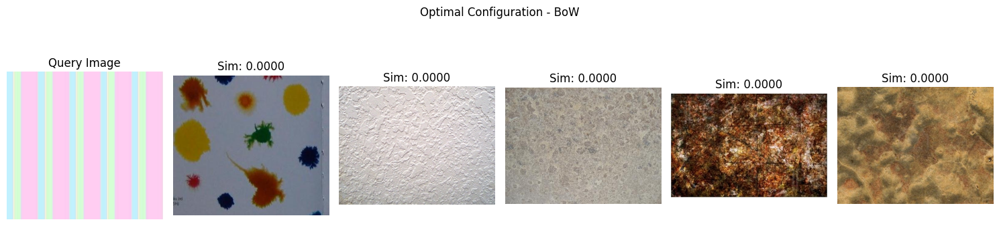

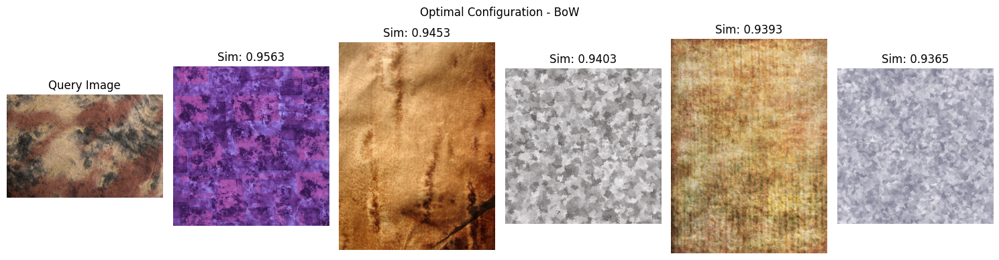

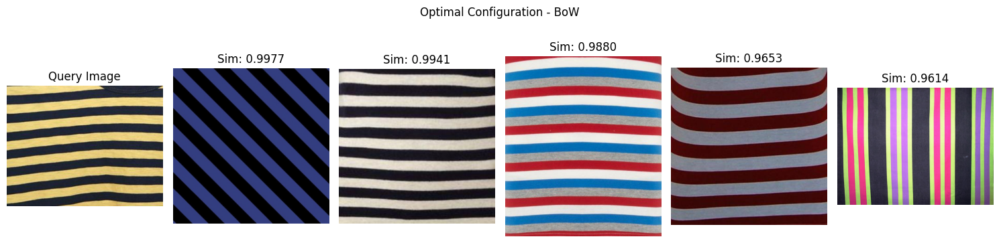

In [30]:
def run_optimal_configuration(images, query_indices, optimal_params):
    """Run the image retrieval system with the optimal parameters"""
    optimal_image_count = optimal_params['optimal_image_count']
    optimal_centroids = optimal_params['optimal_centroids']
    optimal_representation = optimal_params['optimal_representation']
    
    print(f"\n=== Running Optimal Configuration ===")
    print(f"Training images: {optimal_image_count}")
    print(f"Centroids: {optimal_centroids}")
    print(f"Representation: {optimal_representation}")
    
    # Select random subset for training
    training_indices = np.random.choice(len(images), optimal_image_count, replace=False)
    training_images = [images[i] for i in training_indices]
    
    # Extract features from training images
    _, all_descriptors = extract_sift_features(training_images)
    
    # Build vocabulary from training features
    kmeans = build_vocabulary(all_descriptors, optimal_centroids)
    
    # Extract features from all images
    all_features, _ = extract_sift_features(images)
    
    # Create BoW histograms
    bow_histograms = create_bow_histograms(all_features, kmeans)
    
    # Create representation based on optimal choice
    if optimal_representation == "TF-IDF":
        representation = create_tfidf_representation(bow_histograms)
    else:
        representation = bow_histograms
    
    # For each query image
    results = {}
    for query_idx in query_indices:
        # Retrieve similar images
        retrieved_indices, similarities = retrieve_images(query_idx, representation, n=5)
        
        # Display results
        display_retrieval_results(
            query_idx, retrieved_indices, similarities, 
            images, f"Optimal Configuration - {optimal_representation}"
        )
        
        results[query_idx] = {
            'retrieved_indices': retrieved_indices,
            'similarities': similarities
        }
    
    return results

# Run the system with optimal parameters
optimal_results = run_optimal_configuration(data_subset, query_indices, optimal_params)